In [ ]:
#see below for code

In [3]:
suppressPackageStartupMessages({
    library(dplyr)
    library(ggplot2)
    library(Matrix)
    #library(scran)
    library(Rtsne)
    #library(BiocParallel)
    require(irlba)
    #library(batchelor)
    library(stringr)
    library(gridExtra) ## can be replaced by just cowplot
    library(cowplot)
    #library(M3C)
    library(Seurat)
    library(tidyr)
})

# chimaera
mixl_data_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/mlnt/3_QC/raw_counts.rds"
mixl_genes_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/mlnt2/PhD_MT07_Mixl1/2_calledCells/genes.tsv"
mixl_meta_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/mlnt/5_doubletDetection/meta.tab" # contains QC performed by Mlnt

# atlas
atlas_data_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/atlas/atlas/raw_counts.mtx"
atlas_genes_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/atlas/atlas/genes.tsv"
atlas_meta_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/atlas/atlas/meta.tab"


# out folder
out_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/data/"
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"

In [ ]:
meta_meso

# load mixl data
mixl_counts = readRDS(mixl_data_in)
mixl_genes = read.table(mixl_genes_in, stringsAsFactors = F)
mixl_meta = read.table(mixl_meta_in, header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
mixl_meta$cell <- paste0('chim_', mixl_meta$cell)
# annotate mixl counts
rownames(mixl_counts) = mixl_genes[,1] #ensembl
colnames(mixl_counts) = mixl_meta$cell

# load atlas data
atlas_counts = readMM(atlas_data_in) # readMM for .mtx input 
atlas_genes = read.table(atlas_genes_in, stringsAsFactors = F)
atlas_meta = read.table(atlas_meta_in, header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
atlas_meta$cell <- paste0('atlas_', atlas_meta$cell)
# annotate atlas counts
rownames(atlas_counts) = atlas_genes[,1] #ensembl
colnames(atlas_counts) = atlas_meta$cell



In [ ]:
meta_meso$cell <- paste0('atlas_', meta_meso$cell)
meta_meso

In [ ]:
big_meta = read.table(paste0(out_folder,"big_meta_mapping.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
big_meta

In [ ]:
colnames(big_meta)

In [ ]:
#big_meta.obs
meta_meso['cell']

In [ ]:
print(unique(big_meta$celltype))
print(unique(meta_meso$celltype))

In [ ]:
length(unique(big_meta$celltype))

In [ ]:
length(unique(meta_meso$celltype))

In [ ]:
unique(meta_meso$celltype)

In [ ]:
dim(big_meta)

In [ ]:
#big_meta_meso = merge(big_meta, meta_meso, by='cell', all.x = TRUE) 
#big_meta_meso

In [ ]:
#colnames(big_meta_meso)
#length(unique(big_meta_meso$celltype.x))
#length(unique(big_meta_meso$celltype.y))
#print(dim(big_meta_meso))
#print(unique(big_meta_meso$celltype.y))

In [ ]:
big_meta$celltype[match(meta_meso$cell, big_meta$cell)] <- levels(meta_meso$celltype)

In [ ]:
colnames(big_meta)
length(unique(big_meta$celltype))
print(dim(big_meta))
print(unique(big_meta$celltype))

In [ ]:
big_meta

In [ ]:
#Save big_meta to new file for the rest as big_meta meso > or was it not necessary to do it now?

# Remapping of paraxial and somitic mesoderm chimeric cells to refined subclusters

In [153]:
# Load in data
big_meta = read.table(paste0(out_folder,"big_meta_mapping+meso3.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
pca_after = as.data.frame(read.csv(paste0(out_folder, 'corrected_pc_complete.csv'), header=T, row.names=1,sep=","))
pca_after$cell <- rownames(pca_after)

In [154]:
# label origin in metadata
big_meta$origin <- sapply(strsplit(big_meta$cell,"_"), `[`, 1) 

In [155]:
# split atlas and chimaera
atlas_cells = big_meta %>% filter(origin=='atlas') %>% .$cell
correct_atlas = pca_after %>% filter(cell %in% atlas_cells)
atlas_meta = big_meta %>% filter(origin=='atlas')
correct_map = pca_after %>% filter(!cell %in% atlas_cells) %>% select(1:50) # keep only PC columns
map_meta = big_meta %>% filter(origin!='atlas') 

In [156]:
# Downsample atlas to 10k cells per timepoint 
keep = lapply(unique(atlas_meta$stage), function(x){
  if(x == "mixed_gastrulation"){
    return(atlas_meta[atlas_meta$stage == x,]$cell)
  } else if(sum(atlas_meta$stage == x) < 10000) {
    return(atlas_meta[atlas_meta$stage == x,]$cell)
  } else {
    return(atlas_meta[atlas_meta$stage == x,]$cell)
    return(sample(hits, 10000))
  }
})
keep = do.call(c, keep)
keep <- as.list(keep)

atlas_meta = atlas_meta %>% filter(cell %in% keep)
correct_atlas = correct_atlas %>% filter(cell %in% keep) %>% select(1:50)

In [ ]:
## standard mapping only on stage & celltype, add extra columns if you want to map them, e.g. meso_subclust
# indicated by ## ADD HERE

In [159]:
## Code for mapping:

library(BiocNeighbors)

getmode <- function(v, dist) {
  tab = table(v)
  #if tie, break to shortest distance
  if(sum(tab == max(tab)) > 1){
    tied = names(tab)[tab == max(tab)]
    sub = dist[v %in% tied]
    names(sub) = v[v %in% tied]
    return(names(sub)[which.min(sub)])
  } else {
    return(names(tab)[which.max(tab)])
  }
}

mnnMap = function(atlas_pca, atlas_meta, map_pca, map_meta, k_map = 10){ 
  require(BiocNeighbors)
  require(scran)
  
  knns = BiocNeighbors::queryKNN(correct_atlas, correct_map, k = k_map, get.index = TRUE, get.distance = FALSE)
  
  #get closest k matching cells
  k.mapped = t(apply(knns$index, 1, function(x) atlas_meta$cell[x]))
  celltypes = t(apply(k.mapped, 1, function(x) atlas_meta$celltype[match(x, atlas_meta$cell)]))
  stages = t(apply(k.mapped, 1, function(x) atlas_meta$stage[match(x, atlas_meta$cell)]))
  meso_subcluster = t(apply(k.mapped, 1, function(x) atlas_meta$meso_subcluster[match(x, atlas_meta$cell)])) #ADD HERE
  celltype.mapped = apply(celltypes, 1, function(x) getmode(x, 1:length(x)))
  stage.mapped = apply(stages, 1, function(x) getmode(x, 1:length(x)))
  meso.mapped = apply(meso_subcluster, 1, function(x) getmode(x, 1:length(x))) ## ADD HERE
  
  out = lapply(1:length(celltype.mapped), function(x){
    list(cells.mapped = k.mapped[x,],
         celltype.mapped = celltype.mapped[x],
         meso.mapped = meso.mapped[x],     ## ADD HERE
         stage.mapped = stage.mapped[x])
  })
  
  names(out) = map_meta$cell

  return(out)
  
}

In [160]:
# Perform mapping:
mapping = mnnMap(correct_atlas, atlas_meta, correct_map, map_meta, k_map = 10)
  
  cn = substr(names(mapping), 5, nchar(names(mapping))) # remove 
  ct = sapply(mapping, function(x) x$celltype.mapped)
  st = sapply(mapping, function(x) x$stage.mapped)
  #hm = sapply(mapping, function(x) x$meso.mapped) ## ADD HERE
  closest = sapply(mapping, function(x) x$cells.mapped[1])
  
  out = data.frame(cell = cn, celltype.mapped = ct, stage.mapped = st, closest.cell = closest) #meso.mapped = hm ## ADD HERE
# save mapped celltypes
write.csv(out, paste0(out_folder, 'chimaera_meso_mapped.csv')) 

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

ERROR: Error in (function (..., row.names = NULL, check.rows = FALSE, check.names = TRUE, : arguments imply differing number of rows: 1, 0


In [ ]:
### visualise mapping
big_meta = read.table(paste0(out_folder,"big_meta.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
mapping <- read.csv(paste0(out_folder, 'chimaera_meso_mapped.csv'), row.names=1)
mapping$cell <- rownames(mapping)

# add cell mapping to metadata
big_meta$stage.mapped = as.character(mapping$stage.mapped[match(big_meta$cell, mapping$cell)])
big_meta$celltype.mapped = as.character(mapping$celltype.mapped[match(big_meta$cell, mapping$cell)])
big_meta$meso.mapped = as.character(mapping$meso.mapped[match(big_meta$cell, mapping$cell)]) ## ADD HERE
big_meta$closest.cell = as.character(mapping$closest.cell[match(big_meta$cell, mapping$cell)])

# only plot chimaera cells
meta <- big_meta %>% filter(!is.na(big_meta$tdTom))

In [ ]:
### save big meta with mapping
write.table(big_meta, file = paste0(out_folder,"big_meta_mapping+meso.tab"), row.names = F, col.names = T, quote = F, sep = "\t")

In [ ]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4')
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$stage.mapped)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas stage", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])
  

pdf1 = table(meta$stage.mapped[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])


pdf2 = table(meta$stage.mapped[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))], 
                   drop = FALSE)

pdf3 = table(meta$stage.mapped, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
    theme_classic() + 
    theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])

options(repr.plot.width = 15, repr.plot.height = 10)
grid.arrange(p1, p2, p3, p4, nrow =2)

In [ ]:

pdf(paste0(plot_folder, "chimaera_stage_mapping.pdf"), height=8, width=10)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

In [ ]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4') # not actually embryo but KO cell line pool
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$celltype.mapped)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas subclusters", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))])
  
  

pdf1 = table(meta$celltype.mapped[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))])


pdf2 = table(meta$celltype.mapped[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))], 
                   drop = FALSE)

pdf3 = table(meta$celltype.mapped, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))])

options(repr.plot.width = 20, repr.plot.height = 10)
grid.arrange(p1, p2, p3, p4, nrow =2)

In [ ]:

pdf(paste0(plot_folder, "chimaera_celltype_mapping_meso.pdf"), height=8, width=20)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

# plot projected cell type on UMAP

In [ ]:
big_meta = read.table(paste0(out_folder,"big_meta_mapping+meso.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
umap = as.data.frame(read.csv(paste0(out_folder, 'umap_after_correction.csv'), header=T, row.names=1,sep=",")) %>% select(1:3)
big_meta = merge(big_meta, umap, by='cell')
source("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plot_colours.R")


In [ ]:
umap

In [ ]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umap2 >= -10)
p1 <- ggplot(big_meta_85, aes(umap1, umap2, color= celltype)) +
    geom_point(alpha=0.5, size = 0.4) +
    geom_point(data=big_meta_85,aes(color=celltype.mapped),alpha=0.2, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltype") +
    ggtitle('Mapped celltypes at E8.25/E8.5') +
    theme(legend.position = "none") +
    theme(plot.title = element_text(hjust = 0.5)) +
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

p2 <- ggplot(big_meta_85, aes(umap1, umap2, color=celltype)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=celltype.mapped),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped celltypes at E8.25/E8.5 (atlas in grey)') +     
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

plot_grid(
  p1, p2,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

In [ ]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "umap_celltype_mapping+meso.png"), height=1000, width=1000)
    grid.arrange(p1, p2)
dev.off()

In [ ]:
meso <- c("Nascent mesoderm",
                     "Mixed mesoderm",
                     "Intermediate mesoderm",
                     "Caudal Mesoderm",
                     "Paraxial mesoderm",
                     "Somitic mesoderm",
                     "Pharyngeal mesoderm",
                     "Head_mesoderm",
                     "Anterior-most_somites",
                     "Presomitic_mesoderm",
                     "Sclerotome",
                     "Dermomyotome",
                     "Posterior-most_somites",
                     "Allantois",
                     "ExE mesoderm", "NMP")
meso_plot <- big_meta %>% filter(celltype %in% meso | celltype.mapped %in% meso)
p1 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=celltype.mapped),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('E8.25/E8.5, color = celltype (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

p2 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=tdTom),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = c('pos' = 'red', 'neg' = 'black'), labels = c('pos' = 'pos', 'neg' = 'neg')) + 
    ggtitle('E8.25/E8.5, color = celltype (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))
                        
grid.arrange(p1, p2, nrow=1)

In [ ]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "umap_meso_mapping.png"), height=750, width=500)
    grid.arrange(p1, p2, nrow = 2)
dev.off()

# Other method to try and do the same as not that many cells seem to map to Carolina's subclusters

In [2]:
suppressPackageStartupMessages({
    library(dplyr)
    library(ggplot2)
    library(Matrix)
    library(scran)
    library(Rtsne)
    library(BiocParallel)
    require(irlba)
    library(batchelor)
    library(stringr)
    library(gridExtra) ## can be replaced by just cowplot
    library(cowplot)
    library(M3C)
    library(SummarizedExperiment)
})

In [4]:
#big_meta = read.table("/rds/project/bg200/rds-bg200-hphi-gottgens/users/mb2338/annabelle/12_march/big_meta_mapping.tab", header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")

In [20]:
big_meta = read.csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/wt_chim_atlas_analysis.csv", header = TRUE)

In [21]:
colnames(big_meta)

[1] "X"                   "barcode"             "batch"              
 [4] "cell"                "celltype"            "celltype.mapped"    
 [7] "closest.cell"        "cluster"             "cluster.stage"      
[10] "cluster.sub"         "cluster.theiler"     "colour"             
[13] "doub.density"        "doublet"             "endo_gephiX"        
[16] "endo_gephiY"         "endo_gutCluster"     "endo_gutDPT"        
[19] "endo_gutX"           "endo_gutY"           "endo_trajectoryDPT" 
[22] "endo_trajectoryName" "haem_gephiX"         "haem_gephiY"        
[25] "haem_subclust"       "sample"              "sequencing.batch"   
[28] "sizeFactor"          "stage"               "stage.mapped"       
[31] "stripped"            "tdTom"               "theiler"            
[34] "umapX"               "umapY"

In [81]:
big_meta$celltype_origin

[1] NA                               NA                              
    [3] NA                               NA                              
    [5] NA                               NA                              
    [7] NA                               NA                              
    [9] NA                               NA                              
   [11] NA                               NA                              
   [13] NA                               NA                              
   [15] NA                               NA                              
   [17] NA                               NA                              
   [19] NA                               NA                              
   [21] NA                               NA                              
   [23] NA                               NA                              
   [25] NA                               NA                              
   [27] NA                               NA                              
   [29] NA                               NA                              
   [31] NA                               NA                              
   [33] NA                               NA                              
   [35] NA                               NA                              
   [37] NA                               NA                              
   [39] NA                               NA                              
   [41] NA                               NA                              
   [43] NA                               NA                              
   [45] NA                               NA                              
   [47] NA                               NA                              
   [49] NA                               NA                              
   [51] NA                               NA                              
   [53] NA                               NA                              
   [55] NA                               NA                              
   [57] NA                               NA                              
   [59] NA                               NA                              
   [61] NA                               NA                              
   [63] NA                               NA                              
   [65] NA                               NA                              
   [67] NA                               NA                              
   [69] NA                               NA                              
   [71] NA                               NA                              
   [73] NA                               NA                              
   [75] NA                               NA                              
   [77] NA                               NA                              
   [79] NA                               NA                              
   [81] NA                               NA                              
   [83] NA                               NA                              
   [85] NA                               NA                              
   [87] NA                               NA                              
   [89] NA                               NA                              
   [91] NA                               NA                              
   [93] NA                               NA                              
   [95] NA                               NA                              
   [97] NA                               NA                              
   [99] NA                               NA                              
  [101] NA                               NA                              
  [103] NA                               NA                              
  [105] NA                               NA                              
  [107] NA                               NA                              
  [109] 

In [22]:
test <- big_meta[!(big_meta$haem_subclust=='nan'),]
unique(test$haem_subclust)
unique(test$celltype)

[1] "BP1"   "Mes2"  "BP2"   "Mes1"  "Haem2" "Haem1" "EC3"   "EC2"   "Haem3"
[10] "EC1"   "Ery1"  "Haem4" "EC8"   "Ery2"  "EC4"   "EC5"   "BP4"   "BP3"  
[19] "EC6"   "EC7"   "Ery3"  "My"    "Ery4"  "Mk"

[1] "Blood progenitors 2"            "Mixed mesoderm"                
[3] "Haematoendothelial progenitors" "Blood progenitors 1"           
[5] "Erythroid1"                     "Endothelium"                   
[7] "Erythroid2"                     "Erythroid3"

In [23]:
test

,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sample,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>
340,atlas_cell_363-0,AAAGATCTCTCGAA,0,atlas_cell_363,Blood progenitors 2,nan,nan,14,5,1,⋯,2,1,NA,E7.5,nan,0,nan,TS11,3.46052059,15.574629
346,atlas_cell_369-0,AACACGTGTGTCGA,0,atlas_cell_369,Mixed mesoderm,nan,nan,5,12,4,⋯,2,1,NA,E7.5,nan,0,nan,TS11,0.00825196,5.566576
357,atlas_cell_382-0,AATCTCACTGCTTT,0,atlas_cell_382,Blood progenitors 2,nan,nan,14,5,2,⋯,2,1,NA,E7.5,nan,0,nan,TS11,2.49043289,14.971734
360,atlas_cell_385-0,AATGGCTGAAGATG,0,atlas_cell_385,Blood progenitors 2,nan,nan,14,5,2,⋯,2,1,NA,E7.5,nan,0,nan,TS11,2.35120325,15.267069
365,atlas_cell_393-0,ACACATCTGTCAAC,0,atlas_cell_393,Blood progenitors 2,nan,nan,14,5,1,⋯,2,1,NA,E7.5,nan,0,nan,TS11,5.89909819,14.388825
370,atlas_cell_398-0,ACGACAACTGGAGG,0,atlas_cell_398,Blood progenitors 2,nan,nan,14,5,1,⋯,2,1,NA,E7.5,nan,0,nan,TS11,4.82313877,15.374831
376,atlas_cell_405-0,ACGTTACTGACGAG,0,atlas_cell_405,Mixed mesoderm,nan,nan,5,12,8,⋯,2,1,NA,E7.5,nan,0,nan,TS11,-1.49568829,2.522198
377,atlas_cell_407-0,ACTATCACATTCCT,0,atlas_cell_407,Haematoendothelial progenitors,nan,nan,19,5,1,⋯,2,1,NA,E7.5,nan,0,nan,TS11,-0.78802760,11.991024
380,atlas_cell_410-0,ACTCCCGAGTCACA,0,atlas_cell_410,Blood progenitors 1,nan,nan,19,5,3,⋯,2,1,NA,E7.5,nan,0,nan,TS11,1.26255068,13.841321


In [24]:
dim(test)

[1] 15875    35

In [25]:
# strip last character of meta$X
big_meta$cell = gsub('.{2}$', '', big_meta$X)

# trying to subset only chimera cells

In [26]:
# label origin in metadata
big_meta$origin <- sapply(strsplit(big_meta$cell,"_"), `[`, 1) 

In [27]:
big_meta_chim = big_meta %>% filter(origin=='wt') %>% .$cell

In [28]:
chim_meta = big_meta %>% filter(origin=='wt')
chim_meta

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>
wt_cell_1-1,AAACCTGAGACCTTTG,1,wt_cell_1,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_52006,NA,NA,NA,⋯,1,2.022277,E7.5,E7.5,0,pos,nan,NA,NA,wt
wt_cell_2-1,AAACCTGAGCGCCTCA,1,wt_cell_2,Mesenchyme,Mesenchyme,atlas_cell_33502,NA,NA,NA,⋯,1,2.104918,E7.5,E8.0,0,pos,nan,NA,NA,wt
wt_cell_3-1,AAACCTGAGGATCGCA,1,wt_cell_3,Primitive Streak,Primitive Streak,atlas_cell_112755,NA,NA,NA,⋯,1,1.880656,E7.5,E7.0,0,pos,nan,NA,NA,wt
wt_cell_4-1,AAACCTGCACGTAAGG,1,wt_cell_4,NMP,NMP,atlas_cell_68127,NA,NA,NA,⋯,1,1.365427,E7.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_5-1,AAACCTGCAGACAGGT,1,wt_cell_5,Caudal Mesoderm,Caudal Mesoderm,atlas_cell_68596,NA,NA,NA,⋯,1,1.899682,E7.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_6-1,AAACCTGGTCTAGCCG,1,wt_cell_6,Surface ectoderm,Surface ectoderm,atlas_cell_127534,NA,NA,NA,⋯,1,1.581918,E7.5,E8.0,0,pos,nan,NA,NA,wt
wt_cell_7-1,AAACCTGGTGAGTGAC,1,wt_cell_7,NMP,NMP,atlas_cell_95254,NA,NA,NA,⋯,1,2.066494,E7.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_8-1,AAACGGGCACGTGAGA,1,wt_cell_8,Somitic mesoderm,Somitic mesoderm,atlas_cell_27303,NA,NA,NA,⋯,1,1.239856,E7.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_9-1,AAACGGGGTGAAAGAG,1,wt_cell_9,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_57816,NA,NA,NA,⋯,1,3.159522,E7.5,mixed_gastrulation,0,pos,nan,NA,NA,wt


In [29]:
#filter stages E8.5 and E8.25
chim_meta_85 <- chim_meta %>% filter(chim_meta$stage %in% c('E8.5', 'E8.25'))

In [30]:
chim_meta_85

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>
wt_cell_9951-1,AAACCTGAGACTGTAA,1,wt_cell_9951,Mesenchyme,Mesenchyme,atlas_cell_121165,NA,NA,NA,⋯,1,2.099562,E8.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_9952-1,AAACCTGAGATGCCTT,1,wt_cell_9952,Endothelium,Endothelium,atlas_cell_96660,NA,NA,NA,⋯,1,2.120962,E8.5,E8.5,0,pos,nan,NA,NA,wt
wt_cell_9953-1,AAACCTGAGCAGCCTC,1,wt_cell_9953,Allantois,Allantois,atlas_cell_99680,NA,NA,NA,⋯,1,2.047792,E8.5,E8.5,0,pos,nan,NA,NA,wt
wt_cell_9954-1,AAACCTGCATACTCTT,1,wt_cell_9954,Erythroid3,Erythroid3,atlas_cell_135387,NA,NA,NA,⋯,1,1.762332,E8.5,E8.5,0,pos,nan,NA,NA,wt
wt_cell_9955-1,AAACGGGTCAACACCA,1,wt_cell_9955,Erythroid1,Erythroid1,atlas_cell_129986,NA,NA,NA,⋯,1,2.217014,E8.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_9956-1,AAACGGGTCACTCTTA,1,wt_cell_9956,Endothelium,Endothelium,atlas_cell_39198,NA,NA,NA,⋯,1,2.492510,E8.5,E8.5,0,pos,nan,NA,NA,wt
wt_cell_9957-1,AAAGATGAGCTGTCTA,1,wt_cell_9957,Pharyngeal mesoderm,Pharyngeal mesoderm,atlas_cell_67292,NA,NA,NA,⋯,1,1.959074,E8.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_9958-1,AAAGATGAGGGAAACA,1,wt_cell_9958,Forebrain/Midbrain/Hindbrain,Forebrain/Midbrain/Hindbrain,atlas_cell_68354,NA,NA,NA,⋯,1,3.135179,E8.5,E8.25,0,pos,nan,NA,NA,wt
wt_cell_9959-1,AAAGATGAGTTGAGTA,1,wt_cell_9959,Forebrain/Midbrain/Hindbrain,Forebrain/Midbrain/Hindbrain,atlas_cell_39728,NA,NA,NA,⋯,1,3.143857,E8.5,E8.5,0,pos,nan,NA,NA,wt


In [ ]:
#chim_meta_85$celltype.mapped[match(meta_meso$cell, chim_meta_85$closest.cell)] <- levels(meta_meso$celltype)

In [34]:
#Filter only the cells in chim_meta that also appear in the refined meta_meso
chim_meta_85f <- chim_meta %>% filter(chim_meta$closest.cell %in% test$cell)

In [32]:
#chim_meta_85f <- chim_meta_85f[!(chim_meta_85f$haem_subclust =='nan'),]

In [35]:
chim_meta_85f

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>
wt_cell_1-1,AAACCTGAGACCTTTG,1,wt_cell_1,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_52006,NA,NA,NA,⋯,1,2.0222769,E7.5,E7.5,0,pos,nan,NA,NA,wt
wt_cell_9-1,AAACGGGGTGAAAGAG,1,wt_cell_9,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_57816,NA,NA,NA,⋯,1,3.1595221,E7.5,mixed_gastrulation,0,pos,nan,NA,NA,wt
wt_cell_29-1,AAAGTAGCATAGTAAG,1,wt_cell_29,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_21219,NA,NA,NA,⋯,1,2.2303185,E7.5,E8.0,0,pos,nan,NA,NA,wt
wt_cell_31-1,AAAGTAGGTCTAAAGA,1,wt_cell_31,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_125227,NA,NA,NA,⋯,1,1.4910985,E7.5,E8.0,0,pos,nan,NA,NA,wt
wt_cell_37-1,AACACGTAGGGATGGG,1,wt_cell_37,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_124667,NA,NA,NA,⋯,1,2.3037251,E7.5,E8.0,0,pos,nan,NA,NA,wt
wt_cell_46-1,AACCATGCAAGTTGTC,1,wt_cell_46,Blood progenitors 2,Blood progenitors 2,atlas_cell_17684,NA,NA,NA,⋯,1,1.6936140,E7.5,E7.75,0,pos,nan,NA,NA,wt
wt_cell_53-1,AACCGCGCAGCGTCCA,1,wt_cell_53,Blood progenitors 2,Blood progenitors 2,atlas_cell_11821,NA,NA,NA,⋯,1,2.9460286,E7.5,E7.75,0,pos,nan,NA,NA,wt
wt_cell_57-1,AACCGCGTCACGCGGT,1,wt_cell_57,Pharyngeal mesoderm,Pharyngeal mesoderm,atlas_cell_57063,NA,NA,NA,⋯,1,1.7224887,E7.5,E7.5,0,pos,nan,NA,NA,wt
wt_cell_61-1,AACGTTGGTACGCTGC,1,wt_cell_61,ExE mesoderm,ExE mesoderm,atlas_cell_34257,NA,NA,NA,⋯,1,0.9049186,E7.5,E8.5,0,pos,nan,NA,NA,wt


In [36]:
unique(chim_meta_85f$celltype.mapped)

[1] "Haematoendothelial progenitors" "Blood progenitors 2"           
 [3] "Pharyngeal mesoderm"            "ExE mesoderm"                  
 [5] "Mixed mesoderm"                 "Blood progenitors 1"           
 [7] "Nascent mesoderm"               "Paraxial mesoderm"             
 [9] "Endothelium"                    "Erythroid1"                    
[11] "Intermediate mesoderm"          "Surface ectoderm"              
[13] "Mesenchyme"                     "Caudal neurectoderm"           
[15] "Erythroid3"                     "Erythroid2"                    
[17] "Allantois"

In [37]:
rownames(test) = unique(test$cell)

In [38]:
na.omit(test[chim_meta_85$closest.cell,])

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sample,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>


In [39]:
test$haem_subclust

[1] "BP1"   "Mes2"  "BP1"   "BP1"   "BP2"   "BP1"   "Mes1"  "Haem2" "Haem2"
   [10] "Haem1" "Haem2" "BP1"   "Haem2" "EC3"   "BP1"   "Haem2" "BP1"   "Mes2" 
   [19] "Haem2" "Haem2" "BP1"   "BP1"   "BP2"   "Haem1" "Mes2"  "Mes2"  "BP2"  
   [28] "Mes2"  "Mes2"  "Haem2" "EC2"   "Mes2"  "Mes2"  "BP1"   "Mes2"  "BP1"  
   [37] "BP2"   "BP1"   "BP1"   "BP1"   "Mes2"  "BP1"   "Mes2"  "Mes1"  "BP1"  
   [46] "Mes2"  "Haem2" "Mes2"  "BP1"   "Mes2"  "Haem2" "Haem1" "BP1"   "Haem2"
   [55] "Mes1"  "Mes1"  "Mes1"  "BP1"   "Mes2"  "EC2"   "Mes2"  "Mes1"  "Mes2" 
   [64] "BP1"   "BP1"   "BP1"   "Mes2"  "Mes2"  "Mes2"  "Haem1" "Mes2"  "Mes2" 
   [73] "Mes2"  "Haem2" "Mes1"  "Mes2"  "Haem2" "Mes2"  "Mes2"  "Mes2"  "BP1"  
   [82] "Mes2"  "Mes1"  "Mes2"  "Mes2"  "Mes2"  "Mes2"  "Mes2"  "Haem2" "Mes2" 
   [91] "BP1"   "EC2"   "Haem2" "Mes2"  "Mes2"  "Mes1"  "Mes1"  "Mes2"  "BP1"  
  [100] "Haem2" "Mes2"  "Mes2"  "Mes1"  "Haem2" "Mes1"  "BP1"   "Mes2"  "Mes2" 
  [109] "Mes2"  "Mes2"  "Haem2" "Mes1"  "Mes2"  "Mes2"  "Haem2" "Haem1" "Haem2"
  [118] "Mes2"  "Haem2" "Haem2" "Haem2" "Mes2"  "Haem2" "Mes2"  "BP1"   "Haem2"
  [127] "Haem2" "Mes2"  "Haem2" "Mes2"  "Haem2" "BP1"   "Mes2"  "Mes2"  "Haem2"
  [136] "Mes2"  "BP1"   "Haem2" "Haem2" "Mes2"  "Haem1" "Haem3" "Haem2" "Haem2"
  [145] "BP1"   "Mes1"  "Mes2"  "Mes2"  "Haem2" "Mes2"  "Haem1" "Mes1"  "BP1"  
  [154] "Mes2"  "Haem2" "Mes2"  "EC2"   "Haem2" "Haem2" "Mes2"  "Haem2" "Mes2" 
  [163] "Mes2"  "Haem2" "Mes2"  "Mes2"  "Mes1"  "Haem1" "Haem2" "Haem2" "Mes2" 
  [172] "Mes1"  "BP1"   "Haem2" "Haem2" "Mes1"  "Mes2"  "Haem2" "Mes2"  "BP1"  
  [181] "Haem2" "Mes1"  "Mes2"  "Mes2"  "Mes2"  "BP1"   "BP1"   "Haem2" "Mes2" 
  [190] "Haem2" "EC2"   "Mes1"  "Mes2"  "Haem2" "BP1"   "BP1"   "Mes2"  "Haem2"
  [199] "Haem2" "Mes2"  "Haem2" "Mes2"  "Haem2" "BP1"   "Haem2" "Mes1"  "Haem2"
  [208] "Haem2" "Mes2"  "Haem2" "BP1"   "Mes2"  "Mes2"  "Haem2" "Mes1"  "Mes2" 
  [217] "Mes2"  "Mes2"  "Mes2"  "Haem1" "BP1"   "Mes2"  "Haem2" "Haem1" "Haem2"
  [226] "Mes2"  "EC2"   "Mes2"  "Haem2" "BP1"   "Mes2"  "BP1"   "Mes2"  "Haem1"
  [235] "Mes2"  "Mes2"  "Mes2"  "Haem2" "Mes2"  "BP1"   "Mes2"  "Haem2" "Haem2"
  [244] "Mes2"  "Haem2" "Mes2"  "Haem2" "Mes2"  "Mes1"  "Haem2" "Mes2"  "Mes1" 
  [253] "Haem2" "Mes2"  "Mes2"  "BP1"   "Haem2" "Haem2" "Haem2" "Mes2"  "Haem2"
  [262] "Mes2"  "Mes2"  "Mes1"  "Mes2"  "Haem2" "Haem1" "Mes2"  "Mes2"  "Mes1" 
  [271] "Haem2" "Haem2" "Haem2" "Haem2" "Haem2" "Mes2"  "Mes2"  "Haem2" "Mes2" 
  [280] "Mes2"  "Mes2"  "Mes1"  "Mes2"  "Haem1" "Mes2"  "EC2"   "Haem2" "Mes1" 
  [289] "Mes2"  "Haem2" "Mes2"  "Mes2"  "Mes2"  "Haem2" "BP1"   "BP1"   "Mes2" 
  [298] "Haem1" "Mes2"  "Mes2"  "Mes2"  "Mes1"  "Haem1" "Haem2" "Haem2" "Haem1"
  [307] "Haem2" "Haem2" "Mes2"  "Mes2"  "Haem1" "Haem2" "Mes2"  "Haem1" "Mes2" 
  [316] "BP1"   "Mes2"  "Mes2"  "Mes2"  "Mes2"  "Haem2" "Haem1" "Mes2"  "Mes2" 
  [325] "Mes2"  "Haem1" "Haem2" "Mes2"  "Mes2"  "Mes2"  "Mes2"  "Mes2"  "Mes2" 
  [334] "Mes2"  "Haem1" "Haem2" "Mes2"  "Mes2"  "Haem2" "Mes2"  "Mes1"  "Mes2" 
  [343] "Haem2" "BP1"   "Haem2" "Mes2"  "Haem2" "Haem2" "Haem1" "Haem2" "Mes2" 
  [352] "Mes2"  "Haem2" "BP1"   "Mes2"  "BP1"   "Mes2"  "Haem2" "Haem2" "Haem1"
  [361] "Mes2"  "Mes2"  "Mes1"  "Haem2" "Mes2"  "Mes2"  "Mes2"  "Mes2"  "Mes1" 
  [370] "Mes2"  "Mes2"  "Mes1"  "Mes2"  "Mes1"  "Mes2"  "Mes2"  "Mes1"  "Haem1"
  [379] "Mes1"  "Mes2"  "Mes2"  "Mes2"  "Mes1"  "Haem1" "Mes1"  "Haem1" "Mes1" 
  [388] "Haem1" "Haem1" "Haem1" "Haem1" "BP2"   "BP1"   "Haem2" "BP1"   "BP2"  
  [397] "BP1"   "BP1"   "EC3"   "Haem2" "Mes2"  "Haem2" "BP1"   "Haem2" "BP1"  
  [406] "BP1"   "Haem3" "BP2"   "Haem2" "Haem2" "Haem2" "Mes2"  "Haem1" "BP2"  
  [415] "BP1"   "BP1"   "Mes1"  "Haem2" "EC2"   "Mes2"  "BP1"   "Mes2"  "Haem2"
  [424] "BP1"   "Mes1"  "BP1"   "Haem3" "BP1"   "Haem2" "BP1"   "BP2"   "EC1"  
  [433] "Mes2"  "BP1"   "BP1"   "Mes2"  "BP1"   "BP1"   "BP2"   "Haem2" "Haem2"
  [442] "BP1"   "Haem1" "Haem2" "Haem1" "Haem2" "Haem2" "BP1"   "Haem2" "Mes2" 
  [4

In [40]:
chim_meta_85f$haem_subclust.mapped <- test[chim_meta_85f$closest.cell,]$haem_subclust

In [41]:
chim_meta_85f

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
wt_cell_1-1,AAACCTGAGACCTTTG,1,wt_cell_1,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_52006,NA,NA,NA,⋯,2.0222769,E7.5,E7.5,0,pos,nan,NA,NA,wt,Haem2
wt_cell_9-1,AAACGGGGTGAAAGAG,1,wt_cell_9,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_57816,NA,NA,NA,⋯,3.1595221,E7.5,mixed_gastrulation,0,pos,nan,NA,NA,wt,Haem1
wt_cell_29-1,AAAGTAGCATAGTAAG,1,wt_cell_29,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_21219,NA,NA,NA,⋯,2.2303185,E7.5,E8.0,0,pos,nan,NA,NA,wt,Haem2
wt_cell_31-1,AAAGTAGGTCTAAAGA,1,wt_cell_31,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_125227,NA,NA,NA,⋯,1.4910985,E7.5,E8.0,0,pos,nan,NA,NA,wt,EC3
wt_cell_37-1,AACACGTAGGGATGGG,1,wt_cell_37,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_124667,NA,NA,NA,⋯,2.3037251,E7.5,E8.0,0,pos,nan,NA,NA,wt,EC2
wt_cell_46-1,AACCATGCAAGTTGTC,1,wt_cell_46,Blood progenitors 2,Blood progenitors 2,atlas_cell_17684,NA,NA,NA,⋯,1.6936140,E7.5,E7.75,0,pos,nan,NA,NA,wt,BP1
wt_cell_53-1,AACCGCGCAGCGTCCA,1,wt_cell_53,Blood progenitors 2,Blood progenitors 2,atlas_cell_11821,NA,NA,NA,⋯,2.9460286,E7.5,E7.75,0,pos,nan,NA,NA,wt,BP2
wt_cell_57-1,AACCGCGTCACGCGGT,1,wt_cell_57,Pharyngeal mesoderm,Pharyngeal mesoderm,atlas_cell_57063,NA,NA,NA,⋯,1.7224887,E7.5,E7.5,0,pos,nan,NA,NA,wt,Mes2
wt_cell_61-1,AACGTTGGTACGCTGC,1,wt_cell_61,ExE mesoderm,ExE mesoderm,atlas_cell_34257,NA,NA,NA,⋯,0.9049186,E7.5,E8.5,0,pos,nan,NA,NA,wt,EC2


In [43]:
unique(chim_meta_85f$haem_subclust.mapped)

[1] "Haem2" "Haem1" "EC3"   "EC2"   "BP1"   "BP2"   "Mes2"  "EC1"   "Haem4"
[10] "Haem3" "EC8"   "Ery1"  "BP4"   "EC4"   "BP3"   "Mes1"  "Mk"    "My"   
[19] "EC7"   "Ery4"  "Ery2"  "EC5"   "Ery3"  "EC6"

In [44]:
unique(chim_meta_85f$celltype.mapped)

[1] "Haematoendothelial progenitors" "Blood progenitors 2"           
 [3] "Pharyngeal mesoderm"            "ExE mesoderm"                  
 [5] "Mixed mesoderm"                 "Blood progenitors 1"           
 [7] "Nascent mesoderm"               "Paraxial mesoderm"             
 [9] "Endothelium"                    "Erythroid1"                    
[11] "Intermediate mesoderm"          "Surface ectoderm"              
[13] "Mesenchyme"                     "Caudal neurectoderm"           
[15] "Erythroid3"                     "Erythroid2"                    
[17] "Allantois"

# Now re-merge big_meta and chim_meta_85f since newly clustered cells came from variety of initially celltype.mapped which could affect DEG results

In [ ]:
big_meta = read.csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/wt_chim_atlas_analysis.csv", header = TRUE)

In [45]:
big_meta

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>
atlas_cell_1-0,AAAGGCCTCCACAA,0,atlas_cell_1,Epiblast,nan,nan,2,2,4,⋯,1,NA,E6.5,nan,0,nan,TS9,-10.227546,-2.8816875,atlas
atlas_cell_2-0,AACAAACTCGCCTT,0,atlas_cell_2,Primitive Streak,nan,nan,12,1,1,⋯,1,NA,E6.5,nan,0,nan,TS9,-6.625458,0.1089605,atlas
atlas_cell_5-0,AACAGAGAATCAGC,0,atlas_cell_5,ExE ectoderm,nan,nan,3,4,7,⋯,1,NA,E6.5,nan,0,nan,TS9,10.061009,-0.0293132,atlas
atlas_cell_6-0,AACATATGAATCGC,0,atlas_cell_6,Epiblast,nan,nan,1,3,1,⋯,1,NA,E6.5,nan,0,nan,TS9,-10.454418,-0.2694517,atlas
atlas_cell_8-0,AACCGATGGCTTCC,0,atlas_cell_8,Epiblast,nan,nan,2,2,1,⋯,1,NA,E6.5,nan,0,nan,TS9,-11.047206,-2.2052687,atlas
atlas_cell_9-0,AACGTGTGCTCTAT,0,atlas_cell_9,Epiblast,nan,nan,2,2,1,⋯,1,NA,E6.5,nan,0,nan,TS9,-11.111009,-2.7534415,atlas
atlas_cell_10-0,AACTGTCTTCGCAA,0,atlas_cell_10,Epiblast,nan,nan,1,2,4,⋯,1,NA,E6.5,nan,0,nan,TS9,-11.243532,-0.8761099,atlas
atlas_cell_11-0,AAGAACGACCAATG,0,atlas_cell_11,Epiblast,nan,nan,2,2,1,⋯,1,NA,E6.5,nan,0,nan,TS9,-11.821900,-2.1643126,atlas
atlas_cell_12-0,AAGATGGACATTGG,0,atlas_cell_12,Visceral endoderm,nan,nan,11,5,4,⋯,1,NA,E6.5,nan,0,nan,TS9,-2.112586,-12.8742750,atlas


In [46]:
big_meta$haem_subclust.mapped = as.character(chim_meta_85f$haem_subclust.mapped[match(big_meta$cell, chim_meta_85f$cell)])

In [48]:
big_meta$haem_subclust.mapped

[1] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [25] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [49] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [73] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [97] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [121] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [145] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [169] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [193] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [217] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [241] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [265] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [289] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [313] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [337] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [361] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [385] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [409] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [433] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [457] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [481] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [505] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [529] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [553] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [577] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [601] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [625] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [649] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [673] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [697] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [721] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [745] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [769] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [793] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [817] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [841] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [865] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [889] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [913] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [937] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [961] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [985] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1009] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1033] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1057] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1081] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1105] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1129] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1153] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1177] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [12

In [49]:
unique(big_meta$celltype.mapped)

[1] "nan"                            "Haematoendothelial progenitors"
 [3] "Mesenchyme"                     "Primitive Streak"              
 [5] "NMP"                            "Caudal Mesoderm"               
 [7] "Surface ectoderm"               "Somitic mesoderm"              
 [9] "Pharyngeal mesoderm"            "Paraxial mesoderm"             
[11] "Forebrain/Midbrain/Hindbrain"   "Rostral neurectoderm"          
[13] "ExE mesoderm"                   "Neural crest"                  
[15] "Nascent mesoderm"               "Gut"                           
[17] "Notochord"                      "Blood progenitors 2"           
[19] "Intermediate mesoderm"          "Mixed mesoderm"                
[21] "Anterior Primitive Streak"      "Caudal epiblast"               
[23] "Epiblast"                       "Def. endoderm"                 
[25] "Allantois"                      "Spinal cord"                   
[27] "Blood progenitors 1"            "Endothelium"                   
[29] "Caudal neurectoderm"            "Erythroid1"                    
[31] "Cardiomyocytes"                 "ExE ectoderm"                  
[33] "ExE endoderm"                   "Visceral endoderm"             
[35] "PGC"                            "Erythroid3"                    
[37] "Erythroid2"                     "Parietal endoderm"

In [50]:
unique(big_meta$haem_subclust)

[1] "nan"   "BP1"   "Mes2"  "BP2"   "Mes1"  "Haem2" "Haem1" "EC3"   "EC2"  
[10] "Haem3" "EC1"   "Ery1"  "Haem4" "EC8"   "Ery2"  "EC4"   "EC5"   "BP4"  
[19] "BP3"   "EC6"   "EC7"   "Ery3"  "My"    "Ery4"  "Mk"

In [51]:
unique(big_meta$haem_subclust.mapped)

[1] NA      "Haem2" "Haem1" "EC3"   "EC2"   "BP1"   "BP2"   "Mes2"  "EC1"  
[10] "Haem4" "Haem3" "EC8"   "Ery1"  "BP4"   "EC4"   "BP3"   "Mes1"  "Mk"   
[19] "My"    "EC7"   "Ery4"  "Ery2"  "EC5"   "Ery3"  "EC6"

In [70]:
refined_haem <- list(unique(big_meta$haem_subclust))
refined_haem

[[1]]
 [1] "nan"   "BP1"   "Mes2"  "BP2"   "Mes1"  "Haem2" "Haem1" "EC3"   "EC2"  
[10] "Haem3" "EC1"   "Ery1"  "Haem4" "EC8"   "Ery2"  "EC4"   "EC5"   "BP4"  
[19] "BP3"   "EC6"   "EC7"   "Ery3"  "My"    "Ery4"  "Mk"

In [52]:
length(unique(big_meta$celltype.mapped))

[1] 38

In [53]:
### save big meta with mapping
write.csv(big_meta, "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem.csv")

In [13]:
meta = read.csv("C:/Users/aamw4/home/aamw4/wtinjection/wt_chim_atlas_analysis.csv")
meta = meta %>% filter(celltype.mapped != 'Doublet' & celltype.mapped != 'Stripped')
#meta = meta %>% filter(stage == 'E8.5')
meta = meta %>% filter(!(tdTom == 'nan'))

In [14]:
meta

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,...,sample,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,...,<chr>,<int>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>
wt_cell_1-1,AAACCTGAGACCTTTG,1,nan,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_52006,NA,NA,NA,...,mixl_1,1,2.022277,E7.5,E7.5,0,pos,nan,NA,NA
wt_cell_2-1,AAACCTGAGCGCCTCA,1,nan,Mesenchyme,Mesenchyme,atlas_cell_33502,NA,NA,NA,...,mixl_1,1,2.104918,E7.5,E8.0,0,pos,nan,NA,NA
wt_cell_3-1,AAACCTGAGGATCGCA,1,nan,Primitive Streak,Primitive Streak,atlas_cell_112755,NA,NA,NA,...,mixl_1,1,1.880656,E7.5,E7.0,0,pos,nan,NA,NA
wt_cell_4-1,AAACCTGCACGTAAGG,1,nan,NMP,NMP,atlas_cell_68127,NA,NA,NA,...,mixl_1,1,1.365427,E7.5,E8.25,0,pos,nan,NA,NA
wt_cell_5-1,AAACCTGCAGACAGGT,1,nan,Caudal Mesoderm,Caudal Mesoderm,atlas_cell_68596,NA,NA,NA,...,mixl_1,1,1.899682,E7.5,E8.25,0,pos,nan,NA,NA
wt_cell_6-1,AAACCTGGTCTAGCCG,1,nan,Surface ectoderm,Surface ectoderm,atlas_cell_127534,NA,NA,NA,...,mixl_1,1,1.581918,E7.5,E8.0,0,pos,nan,NA,NA
wt_cell_7-1,AAACCTGGTGAGTGAC,1,nan,NMP,NMP,atlas_cell_95254,NA,NA,NA,...,mixl_1,1,2.066494,E7.5,E8.25,0,pos,nan,NA,NA
wt_cell_8-1,AAACGGGCACGTGAGA,1,nan,Somitic mesoderm,Somitic mesoderm,atlas_cell_27303,NA,NA,NA,...,mixl_1,1,1.239856,E7.5,E8.25,0,pos,nan,NA,NA
wt_cell_9-1,AAACGGGGTGAAAGAG,1,nan,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_57816,NA,NA,NA,...,mixl_1,1,3.159522,E7.5,mixed_gastrulation,0,pos,nan,NA,NA


In [5]:
meso_wt = meta %>% filter(!is.na(meta$meso.mapped))

In [6]:
meso_wt

X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,...,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped,gut_subclust.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,...,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
126326,wt_cell_10014-1,AACTCCCAGTATTGGA,1,wt_cell_10014,Somitic mesoderm,Somitic mesoderm,atlas_cell_98468,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Presomitic_mesoderm,NA
126342,wt_cell_10030-1,AAGACCTAGCAAATCA,1,wt_cell_10030,Somitic mesoderm,Somitic mesoderm,atlas_cell_130759,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Presomitic_mesoderm,NA
126389,wt_cell_10077-1,ACACCGGTCGGAAACG,1,wt_cell_10077,Paraxial mesoderm,Paraxial mesoderm,atlas_cell_137735,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Head_mesoderm,NA
126391,wt_cell_10079-1,ACACTGAAGGTACTCT,1,wt_cell_10079,Somitic mesoderm,Somitic mesoderm,atlas_cell_139074,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Posterior-most_somites,NA
126410,wt_cell_10098-1,ACATACGAGGCTCATT,1,wt_cell_10098,Paraxial mesoderm,Paraxial mesoderm,atlas_cell_37158,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Dermomyotome,NA
126440,wt_cell_10128-1,ACGAGGAAGATATGGT,1,wt_cell_10128,Somitic mesoderm,Somitic mesoderm,atlas_cell_99073,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Presomitic_mesoderm,NA
126455,wt_cell_10143-1,ACGATACCAGGTGGAT,1,wt_cell_10143,Paraxial mesoderm,Paraxial mesoderm,atlas_cell_97214,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Head_mesoderm,NA
126491,wt_cell_10179-1,ACGGGCTGTCGAAAGC,1,wt_cell_10179,Somitic mesoderm,Somitic mesoderm,atlas_cell_38563,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Presomitic_mesoderm,NA
126539,wt_cell_10227-1,ACTTACTAGGATATAC,1,wt_cell_10227,Paraxial mesoderm,Paraxial mesoderm,atlas_cell_39613,NA,NA,...,pos,nan,NA,NA,wt,NA,NA,NA,Head_mesoderm,NA


# Visual representation results

In [85]:
# only plot chimaera cells
meta <- big_meta %>% filter(origin == 'wt')

In [87]:
unique(meta$stage.mapped)

[1] "E7.5"               "E8.0"               "E7.0"              
 [4] "E8.25"              "mixed_gastrulation" "E7.75"             
 [7] "E8.5"               "E7.25"              "E6.75"             
[10] "E6.5"

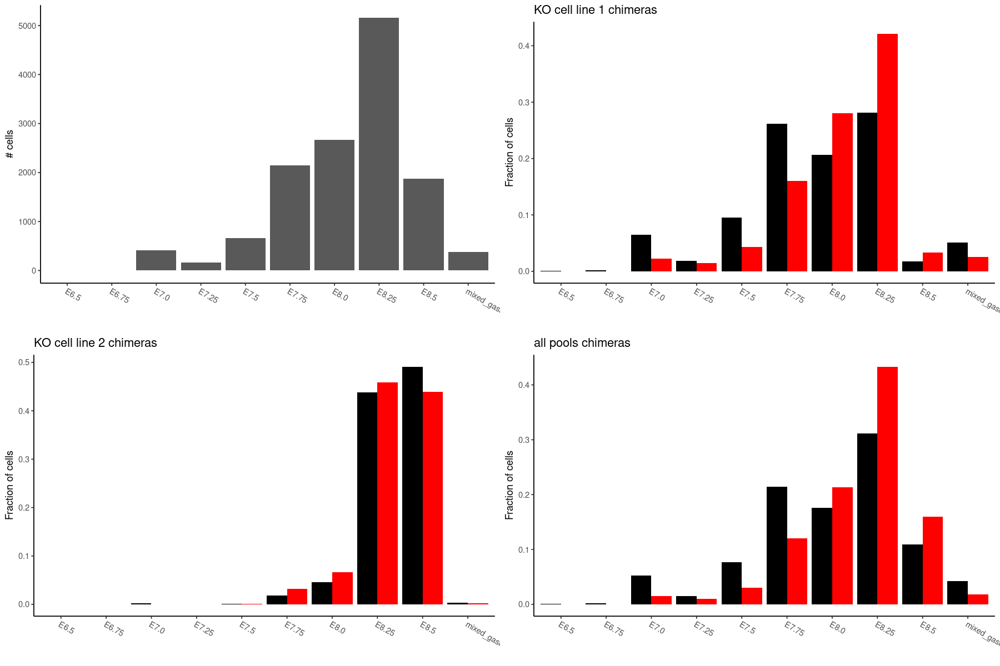

In [90]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4')
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$stage.mapped)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas stage", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])
  

pdf1 = table(meta$stage.mapped[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])


pdf2 = table(meta$stage.mapped[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))], 
                   drop = FALSE)

pdf3 = table(meta$stage.mapped, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
    theme_classic() + 
    theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])

options(repr.plot.width = 15, repr.plot.height = 10)
#plot(p1)
grid.arrange(p1, p2, p3, p4, nrow =2)

In [92]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"

In [93]:
pdf(paste0(plot_folder, "wt_chimaera_stage_mapping.pdf"), height=8, width=10)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

png 
  2

In [91]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4') # not actually embryo but KO cell line pool
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$haem_subclust)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas subclusters", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))])
  
  

pdf1 = table(meta$haem_subclust[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))])


pdf2 = table(meta$haem_subclust[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))], 
                   drop = FALSE)

pdf3 = table(meta$haem_subclust, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))])

options(repr.plot.width = 20, repr.plot.height = 10)
grid.arrange(p1, p2, p3, p4, nrow =2)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': object 'meta' not found


In [96]:

pdf(paste0(plot_folder, "wt_chimaera_celltype_mapping_meso2.pdf"), height=8, width=20)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

png 
  2

In [6]:
#big_meta = read.table(paste0(out_folder,"big_meta_mapping+meso2.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
#umap = read.csv('/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/umap_after_correction.csv', header=T, row.names=1,sep=",") %>% select(1:3)
#big_meta = merge(big_meta, umap, by='cell')
source("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plot_colours.R")


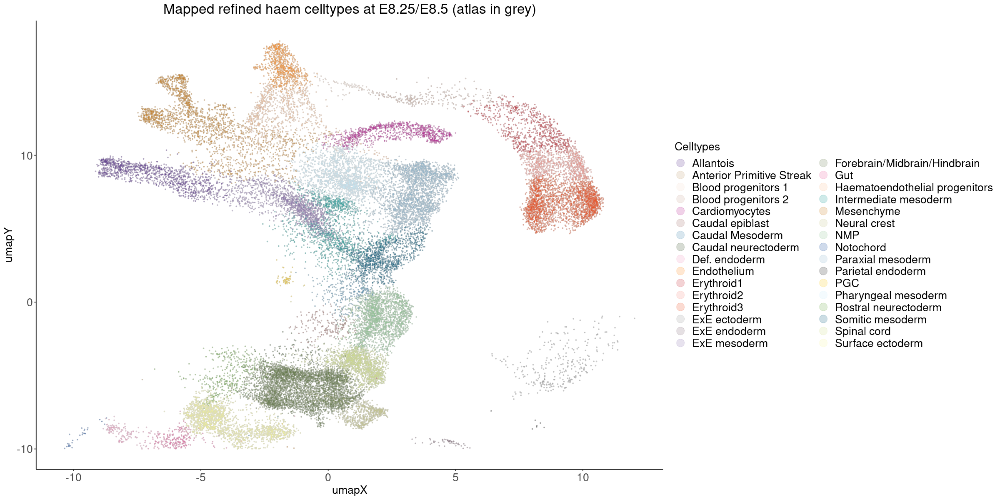

In [114]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

p1 <- ggplot(big_meta_85, aes(umapX, umapY, color= haem_subclust)) +
    geom_point(alpha=0.5, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=celltype),alpha=0.2, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (atlas in grey)') +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) +
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

plot_grid(p1)

In [116]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umap2 >= -10)

#p1 <- ggplot(big_meta_85, aes(umap1, umap2, color= meso.mapped)) +
    #geom_point(alpha=0.5, size = 0.4, color='grey') +
    #geom_point(data=big_meta_85,aes(color=meso_subcluster),alpha=0.2, size = 0.4) +
    #theme_classic() +
    #scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    #ggtitle('Mapped refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') +
    #theme(legend.position = "none") +
    #theme(plot.title = element_text(hjust = 0.5)) +
    #theme(plot.title = element_text(size=20)) +
    #theme(legend.text=element_text(size=16)) + 
    #theme(legend.title=element_text(size=16)) +
    #theme(axis.text = element_text(size = 16)) +
    #theme(axis.title = element_text(size = 16))

#meso.mapped as a function of meso_subcluster
p2 <- ggplot(big_meta_85, aes(umapX, umapY, color=haem_subclust)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=haem_subclust),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = meso_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') +     
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

plot_grid(
  #p1, 
  p2,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

ERROR: Error: Problem with `filter()` input `..1`.
[31m✖[39m Input `..1` must be of size 36375 or 1, not size 0.
[34mℹ[39m Input `..1` is `big_meta_85$umap2 >= -10`.


In [ ]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "umap_celltype_mapping+meso.png"), height=750, width=1250)
    grid.arrange(p1, p2)
dev.off()

In [ ]:
p2 <- ggplot(big_meta_85, aes(umap1, umap2, color=celltype)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=meso.mapped),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = meso_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') +     
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))



plot_grid(
  p2,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

In [ ]:
unique(big_meta$celltype.mapped)

In [ ]:
unique(big_meta$meso_subcluster)

# want to see what initially mapped celltypes were converted to new celltypes

In [54]:
big_meta$celltype_origin = as.character(big_meta$celltype[match(big_meta$cell, chim_meta_85f$closest.cell)]) #atlas cells

In [55]:
length(unique(big_meta$celltype))

[1] 37

In [56]:
length(unique(big_meta$celltype_origin))

[1] 28

In [136]:
df <- unclass(table(big_meta$celltype_origin))
df

Blood progenitors 1            Blood progenitors 2 
                             8                             20 
               Caudal epiblast                Caudal Mesoderm 
                            18                              2 
           Caudal neurectoderm                  Def. endoderm 
                             1                              8 
                      Epiblast                     Erythroid1 
                           429                              1 
                  ExE ectoderm                   ExE endoderm 
                           248                            155 
                  ExE mesoderm                            Gut 
                             9                              8 
Haematoendothelial progenitors          Intermediate mesoderm 
                            16                             14 
                    Mesenchyme                 Mixed mesoderm 
                            40                             35 
              Nascent mesoderm                      Notochord 
                            24                              5 
             Paraxial mesoderm              Parietal endoderm 
                             4                              9 
                           PGC            Pharyngeal mesoderm 
                             4                              4 
              Primitive Streak           Rostral neurectoderm 
                            95                             52 
              Somitic mesoderm               Surface ectoderm 
                             2                              4 
             Visceral endoderm 
                            44

In [137]:
df <- as.data.frame(df) 

In [138]:
summary(df)

       df        
 Min.   :  1.00  
 1st Qu.:  4.00  
 Median :  9.00  
 Mean   : 46.63  
 3rd Qu.: 37.50  
 Max.   :429.00  

In [139]:
rownames(df)
df

[1] "Blood progenitors 1"            "Blood progenitors 2"           
 [3] "Caudal epiblast"                "Caudal Mesoderm"               
 [5] "Caudal neurectoderm"            "Def. endoderm"                 
 [7] "Epiblast"                       "Erythroid1"                    
 [9] "ExE ectoderm"                   "ExE endoderm"                  
[11] "ExE mesoderm"                   "Gut"                           
[13] "Haematoendothelial progenitors" "Intermediate mesoderm"         
[15] "Mesenchyme"                     "Mixed mesoderm"                
[17] "Nascent mesoderm"               "Notochord"                     
[19] "Paraxial mesoderm"              "Parietal endoderm"             
[21] "PGC"                            "Pharyngeal mesoderm"           
[23] "Primitive Streak"               "Rostral neurectoderm"          
[25] "Somitic mesoderm"               "Surface ectoderm"              
[27] "Visceral endoderm"

,df
,<int>
Blood progenitors 1,8
Blood progenitors 2,20
Caudal epiblast,18
Caudal Mesoderm,2
Caudal neurectoderm,1
Def. endoderm,8
Epiblast,429
Erythroid1,1
ExE ectoderm,248


In [140]:
df$count <- df$df
#df$celltype <- rownames(df)
sum(df$count)
percent <- list()
df['percent'] <- NA
df

[1] 1259

,df,count,percent
,<int>,<int>,<lgl>
Blood progenitors 1,8,8,NA
Blood progenitors 2,20,20,NA
Caudal epiblast,18,18,NA
Caudal Mesoderm,2,2,NA
Caudal neurectoderm,1,1,NA
Def. endoderm,8,8,NA
Epiblast,429,429,NA
Erythroid1,1,1,NA
ExE ectoderm,248,248,NA


In [141]:
df <- df %>% tibble::rownames_to_column() %>% mutate(df, percent = count / sum(count) * 100)

df

rowname,df,count,percent
<chr>,<int>,<int>,<dbl>
Blood progenitors 1,8,8,0.63542494
Blood progenitors 2,20,20,1.58856235
Caudal epiblast,18,18,1.42970612
Caudal Mesoderm,2,2,0.15885624
Caudal neurectoderm,1,1,0.07942812
Def. endoderm,8,8,0.63542494
Epiblast,429,429,34.07466243
Erythroid1,1,1,0.07942812
ExE ectoderm,248,248,19.69817315


In [142]:
df2 <- df[order(-df$count),]
df2
df3 <- df2[1:21,]
df3
sum(df3$percent) #95.2996474735605
sum(df3$percent[1:10]) #64.9236192714454
sum(df3$percent[1:6]) #45.6521739130435

,rowname,df,count,percent
,<chr>,<int>,<int>,<dbl>
7,Epiblast,429,429,34.07466243
9,ExE ectoderm,248,248,19.69817315
10,ExE endoderm,155,155,12.31135822
23,Primitive Streak,95,95,7.54567117
24,Rostral neurectoderm,52,52,4.13026211
27,Visceral endoderm,44,44,3.49483717
15,Mesenchyme,40,40,3.17712470
16,Mixed mesoderm,35,35,2.77998411
17,Nascent mesoderm,24,24,1.90627482


,rowname,df,count,percent
,<chr>,<int>,<int>,<dbl>
7,Epiblast,429,429,34.0746624
9,ExE ectoderm,248,248,19.6981732
10,ExE endoderm,155,155,12.3113582
23,Primitive Streak,95,95,7.5456712
24,Rostral neurectoderm,52,52,4.1302621
27,Visceral endoderm,44,44,3.4948372
15,Mesenchyme,40,40,3.1771247
16,Mixed mesoderm,35,35,2.7799841
17,Nascent mesoderm,24,24,1.9062748


[1] 98.88801

[1] 90.70691

[1] 81.25496

In [145]:
out_folder = '/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/'

In [146]:
# save mapped celltypes
write.csv(df2, paste0(out_folder, 'original_celltype_of_remapped_cells-haem-wt.csv')) 

In [57]:
df5 <- unclass(table(big_meta$haem_subclust.mapped))
df5

BP1   BP2   BP3   BP4   EC1   EC2   EC3   EC4   EC5   EC6   EC7   EC8  Ery1 
  258   236     9     8    91   200    35    13    26    12    39    12    89 
 Ery2  Ery3  Ery4 Haem1 Haem2 Haem3 Haem4  Mes1  Mes2    Mk    My 
  209   168   134    67   163   110    17     1    56     5     5

In [58]:
sum(df5)

[1] 1963

In [62]:
### save big meta with mapping
write.csv(big_meta, "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem2.csv", header = TRUE)

In [196]:
big_meta$haem_subclust.mapped

[1] NA      "EC7"   "Ery4"  "Ery1"  "Ery2"  "EC1"   "EC5"   "Ery3"  "EC2"  
[10] "EC6"   "Haem3" "EC4"   "BP2"   "EC8"   "Mk"    "Haem4" "BP3"   "BP1"  
[19] "EC3"   "BP4"   "Haem2" "My"

# more visualizations

In [1]:
big_meta = read.csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem2.csv", header = TRUE)

In [13]:
unique(big_meta$celltype)

[1] "Epiblast"                       "Primitive Streak"              
 [3] "ExE ectoderm"                   "Visceral endoderm"             
 [5] "ExE endoderm"                   "Nascent mesoderm"              
 [7] "Rostral neurectoderm"           "Blood progenitors 2"           
 [9] "Mixed mesoderm"                 "ExE mesoderm"                  
[11] "Intermediate mesoderm"          "Pharyngeal mesoderm"           
[13] "Caudal epiblast"                "PGC"                           
[15] "Mesenchyme"                     "Haematoendothelial progenitors"
[17] "Blood progenitors 1"            "Surface ectoderm"              
[19] "Gut"                            "Paraxial mesoderm"             
[21] "Caudal neurectoderm"            "Notochord"                     
[23] "Somitic mesoderm"               "Caudal Mesoderm"               
[25] "Erythroid1"                     "Def. endoderm"                 
[27] "Parietal endoderm"              "Allantois"                     
[29] "Anterior Primitive Streak"      "Endothelium"                   
[31] "Forebrain/Midbrain/Hindbrain"   "Spinal cord"                   
[33] "Cardiomyocytes"                 "Erythroid2"                    
[35] "NMP"                            "Erythroid3"                    
[37] "Neural crest"

Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 3531 rows containing missing values (geom_point).”


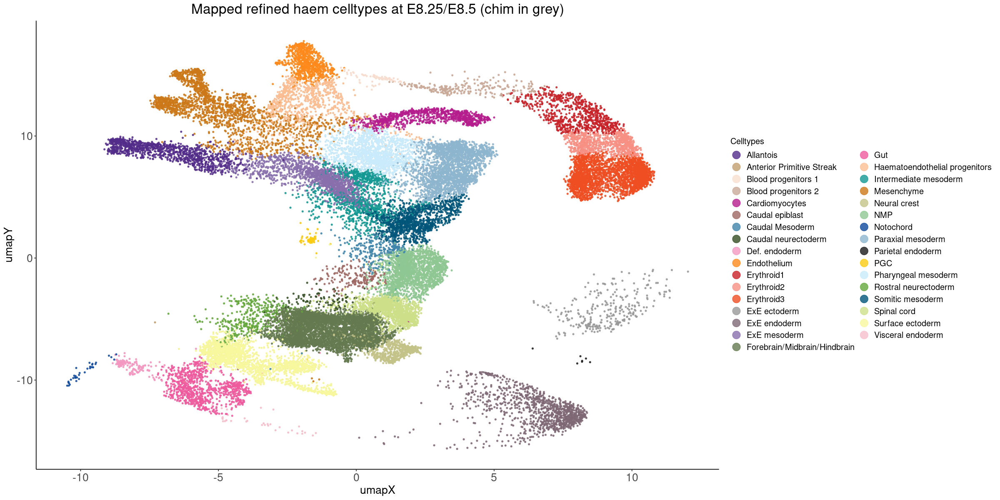

In [12]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

#plot of originally mapped cells now meso.mapped
p1 <- ggplot(big_meta_85, aes(umapX, umapY, color= haem_subclust)) + 
    geom_point(alpha=0.5, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=celltype),alpha=0.8, size = 0.8) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (chim in grey)') +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))


options(repr.plot.width = 20, repr.plot.height = 10)
plot_grid(
  p1,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

In [158]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "wt-umap_celltype_mapping_haem_original_celltypes.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 35833 rows containing missing values (geom_point).”


png 
  2

In [11]:
unique(big_meta$haem_subclust.mapped)

[1] NA      "Haem2" "Haem1" "EC3"   "EC2"   "BP1"   "BP2"   "Mes2"  "EC1"  
[10] "Haem4" "Haem3" "EC8"   "Ery1"  "BP4"   "EC4"   "BP3"   "Mes1"  "Mk"   
[19] "My"    "EC7"   "Ery4"  "Ery2"  "EC5"   "Ery3"  "EC6"

Warning message:
“Removed 13481 rows containing missing values (geom_point).”
Warning message:
“Removed 129793 rows containing missing values (geom_point).”


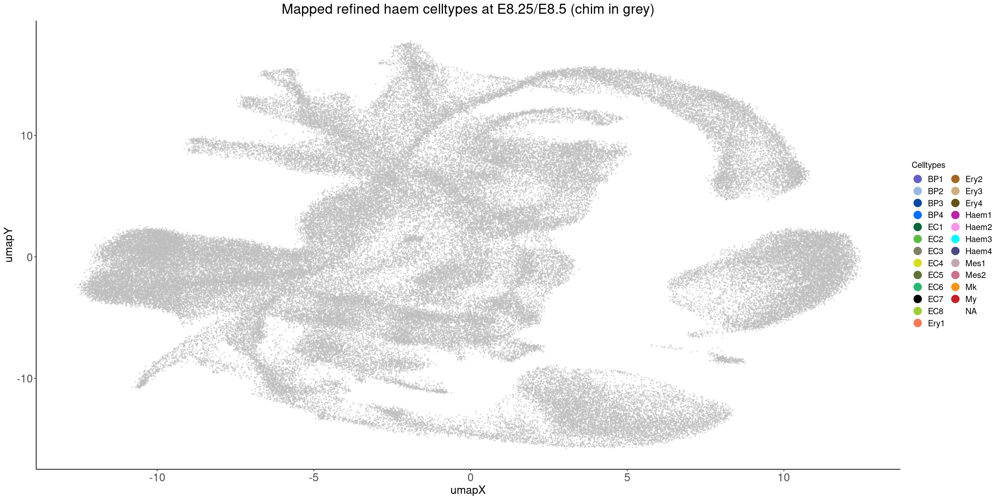

In [9]:
#big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

#plot of originally mapped cells now meso.mapped
p1 <- ggplot(big_meta_85, aes(umapX, umapY, color= celltype.mapped)) + 
    geom_point(alpha=0.5, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=haem_subclust.mapped),alpha=2, size = 2) +
    theme_classic() +
    scale_colour_manual(values = haem_colours, labels = haem_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (chim in grey)') +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 20, repr.plot.height = 10)
plot_grid(p1)

In [73]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

haem <- c( "Haematoendothelial progenitors",
                     "Endothelium",
                     "Blood progenitors 1",
                     "Blood progenitors 2",
                     "Erythroid1",
                     "Erythroid2",
                     "Erythroid3")
meso_plot <- big_meta_85 %>% filter(celltype %in% haem | celltype.mapped %in% haem )


p2 <- ggplot(meso_plot, aes(umapX, umapY)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=tdTom),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = c('pos' = 'red', 'neg' = 'black'), labels = c('pos' = 'pos', 'neg' = 'neg')) + 
    ggtitle('tdTom type at E8.25/E8.5 (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p2)

ERROR: Error: Insufficient values in manual scale. 3 needed but only 2 provided.


In [94]:
png(paste0(plot_folder, "umap_meso_mapping_dtTOM.png"), height=750, width=900)
    grid.arrange(p2)
dev.off()

Warning message:
“Removed 11389 rows containing missing values (geom_point).”


png 
  2

In [183]:
df2$rowname

[1] "Epiblast"                       "ExE ectoderm"                  
 [3] "ExE endoderm"                   "Primitive Streak"              
 [5] "Rostral neurectoderm"           "Visceral endoderm"             
 [7] "Mesenchyme"                     "Mixed mesoderm"                
 [9] "Nascent mesoderm"               "Blood progenitors 2"           
[11] "Caudal epiblast"                "Haematoendothelial progenitors"
[13] "Intermediate mesoderm"          "ExE mesoderm"                  
[15] "Parietal endoderm"              "Blood progenitors 1"           
[17] "Def. endoderm"                  "Gut"                           
[19] "Notochord"                      "Paraxial mesoderm"             
[21] "PGC"                            "Pharyngeal mesoderm"           
[23] "Surface ectoderm"               "Caudal Mesoderm"               
[25] "Somitic mesoderm"               "Caudal neurectoderm"           
[27] "Erythroid1"

In [80]:
big_meta_85

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
atlas_cell_36865-0,AAACATACCACTGA,0,atlas_cell_36865,Neural crest,nan,nan,10,3,8,⋯,E8.5,nan,0,nan,TS12,1.22614512,-7.987035,atlas,NA,NA
atlas_cell_36866-0,AAACATTGCAACTG,0,atlas_cell_36866,Allantois,nan,nan,13,11,7,⋯,E8.5,nan,0,nan,TS12,-6.29479844,9.852460,atlas,NA,NA
atlas_cell_36867-0,AAACATTGGACGAG,0,atlas_cell_36867,Erythroid3,nan,nan,18,19,4,⋯,E8.5,nan,0,nan,TS12,10.35659608,6.400839,atlas,NA,NA
atlas_cell_36869-0,AAACCGTGGCTAAC,0,atlas_cell_36869,Forebrain/Midbrain/Hindbrain,nan,nan,10,12,7,⋯,E8.5,nan,0,nan,TS12,0.91095525,-5.479232,atlas,NA,NA
atlas_cell_36870-0,AAACCGTGTATCTC,0,atlas_cell_36870,Somitic mesoderm,nan,nan,13,9,5,⋯,E8.5,nan,0,nan,TS12,1.54897766,1.385426,atlas,NA,NA
atlas_cell_36871-0,AAACGCACCCAACA,0,atlas_cell_36871,Gut,nan,nan,9,16,8,⋯,E8.5,nan,0,nan,TS12,-5.91165904,-10.271350,atlas,NA,NA
atlas_cell_36872-0,AAACGCACCCTAAG,0,atlas_cell_36872,Spinal cord,nan,nan,16,7,6,⋯,E8.5,nan,0,nan,TS12,1.45559824,-3.568374,atlas,NA,NA
atlas_cell_36873-0,AAACGCTGAGCGGA,0,atlas_cell_36873,Somitic mesoderm,nan,nan,13,18,5,⋯,E8.5,nan,0,nan,TS12,1.62970885,3.168313,atlas,NA,NA
atlas_cell_36874-0,AAACGCTGCCAAGT,0,atlas_cell_36874,Gut,nan,nan,9,16,8,⋯,E8.5,nan,0,nan,TS12,-6.41788996,-10.531616,atlas,NA,NA


Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 3531 rows containing missing values (geom_point).”


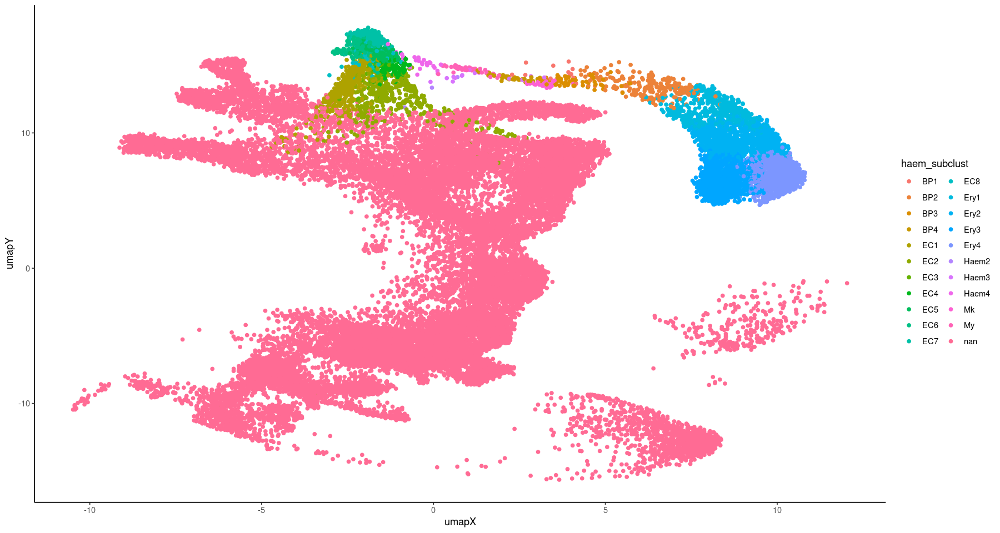

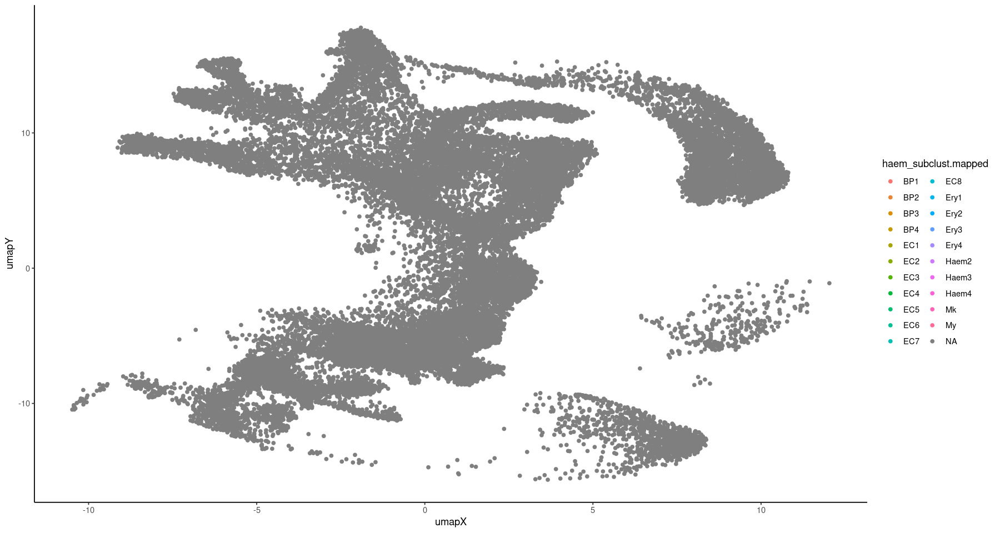

In [79]:
ggplot(big_meta_85, aes(umapX, umapY, color=haem_subclust)) + geom_point() + theme_classic()
ggplot(big_meta_85, aes(umapX, umapY, color=haem_subclust.mapped)) + geom_point() + theme_classic()

Warning message:
“Removed 819 rows containing missing values (geom_point).”
Warning message:
“Removed 7215 rows containing missing values (geom_point).”


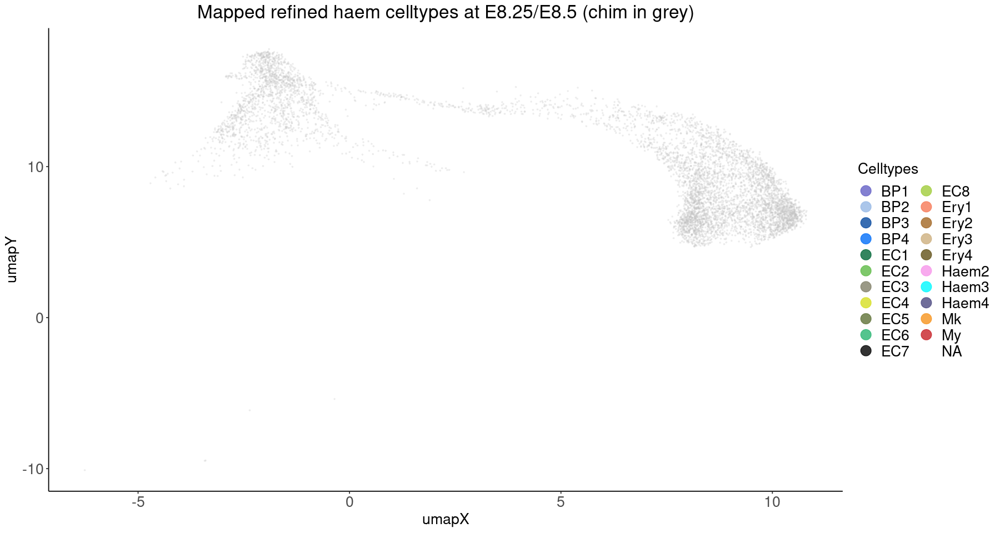

In [78]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umap2 >= -10)

haem_total <- cbind(haem, refined_haem)

meso_plot <- big_meta_85 %>% filter(celltype %in% haem_total | celltype.mapped %in% haem_total | haem_subclust %in% haem_total | haem_subclust.mapped %in% haem_total )
p1 <- ggplot(meso_plot, aes(umapX, umapY)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=haem_subclust.mapped),alpha=0.8, size = 0.8) +
    theme_classic() +
    scale_colour_manual(values = haem_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (chim in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p1)

In [96]:
png(paste0(plot_folder, "umap_meso_mapping_chim_meso-region.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

Warning message:
“Removed 26098 rows containing missing values (geom_point).”


png 
  2

Warning message:
“Removed 11050 rows containing missing values (geom_point).”


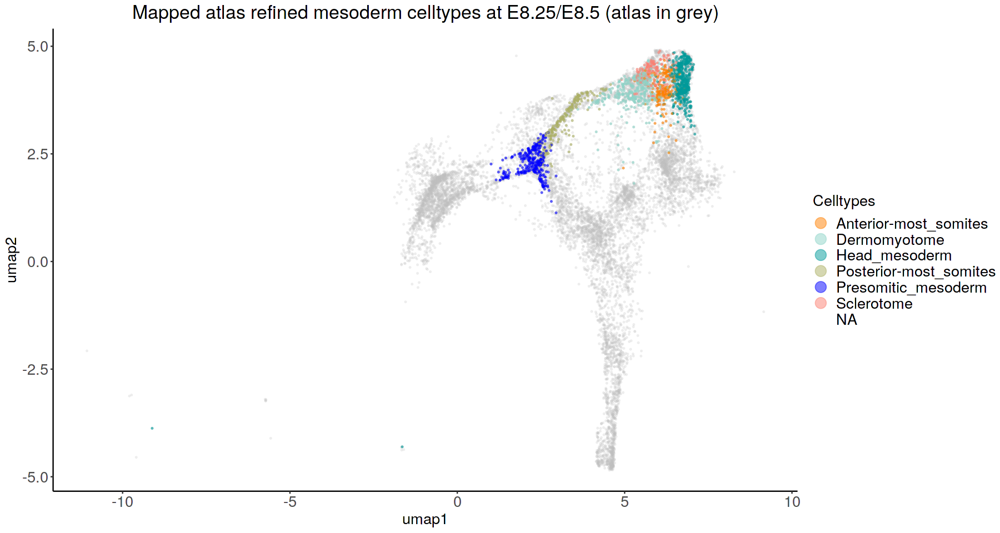

In [97]:
meso <- c("Nascent mesoderm",
                     "Mixed mesoderm",
                     "Intermediate mesoderm",
                     "Caudal Mesoderm",
                     "Paraxial mesoderm",
                     "Somitic mesoderm",
                     "Pharyngeal mesoderm",
                     "Head_mesoderm",
                     "Anterior-most_somites",
                     "Presomitic_mesoderm",
                     "Sclerotome",
                     "Dermomyotome",
                     "Posterior-most_somites",
                     "Allantois",
                     "ExE mesoderm", "NMP")


meso_plot <- big_meta_85 %>% filter(celltype %in% meso | meso.mapped %in% meso | meso_subcluster %in% meso )


p1 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=meso_subcluster),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped atlas refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p1)

In [98]:
png(paste0(plot_folder, "umap_meso_mapping_atlas.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

Warning message:
“Removed 11050 rows containing missing values (geom_point).”


png 
  2

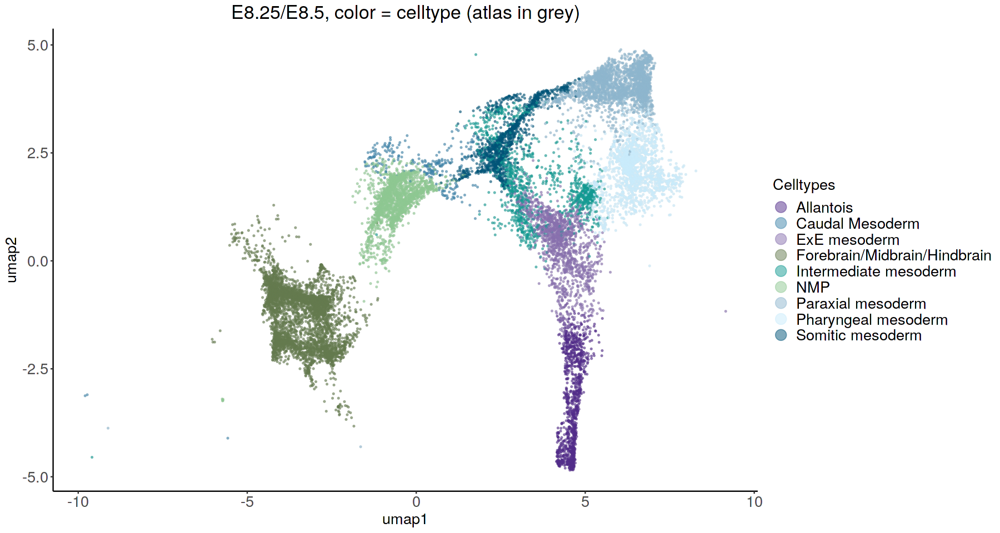

In [99]:
meso <- c("Nascent mesoderm",
                     "Mixed mesoderm",
                     "Intermediate mesoderm",
                     "Caudal Mesoderm",
                     "Paraxial mesoderm",
                     "Somitic mesoderm",
                     "Pharyngeal mesoderm",
                     "Head_mesoderm",
                     "Anterior-most_somites",
                     "Presomitic_mesoderm",
                     "Sclerotome",
                     "Dermomyotome",
                     "Posterior-most_somites",
                     "Allantois",
                     "ExE mesoderm", "NMP",
                     "Forebrain/Midbrain/Hindbrain")


meso_plot <- big_meta_85 %>% filter(celltype %in% meso | celltype_origin %in% meso )


p1 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=celltype),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('E8.25/E8.5, color = celltype (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p1)

In [100]:
png(paste0(plot_folder, "umap_mapping_atlas.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

png 
  2

In [166]:
colnames(big_meta)

[1] "cell"                "sample"              "stage"              
 [4] "barcode"             "sequencing.batch"    "stripped"           
 [7] "doublet"             "theiler"             "doub.density"       
[10] "cluster"             "cluster.sub"         "cluster.stage"      
[13] "cluster.theiler"     "celltype"            "colour"             
[16] "umapX"               "umapY"               "haem_gephiX"        
[19] "haem_gephiY"         "haem_subclust"       "endo_gephiX"        
[22] "endo_gephiY"         "endo_trajectoryName" "endo_trajectoryDPT" 
[25] "endo_gutX"           "endo_gutY"           "endo_gutDPT"        
[28] "endo_gutCluster"     "weight"              "stage.mapped"       
[31] "celltype.mapped"     "closest.cell"        "tdTom"              
[34] "meso.mapped"         "meso_subcluster"     "umap1"              
[37] "umap2"               "celltype_origin"     "origin"

In [165]:
df <- unclass(table(big_meta$celltype.mapped))
df

Allantois      Anterior Primitive Streak 
                          2881                              1 
           Blood progenitors 1            Blood progenitors 2 
                           127                            460 
                Cardiomyocytes                Caudal epiblast 
                          1225                              7 
               Caudal Mesoderm            Caudal neurectoderm 
                           153                              1 
                 Def. endoderm                    Endothelium 
                           444                             22 
                    Erythroid1                     Erythroid2 
                          1141                           2495 
                    Erythroid3                   ExE ectoderm 
                          1518                            167 
                  ExE endoderm                   ExE mesoderm 
                           111                           2977 
  Forebrain/Midbrain/Hindbrain                            Gut 
                          5337                           1102 
Haematoendothelial progenitors          Intermediate mesoderm 
                            19                           1625 
                    Mesenchyme                 Mixed mesoderm 
                           640                              1 
                  Neural crest                            NMP 
                          1407                           2049 
                     Notochord              Paraxial mesoderm 
                            75                           2606 
             Parietal endoderm                            PGC 
                             1                             91 
           Pharyngeal mesoderm           Rostral neurectoderm 
                          2155                             27 
              Somitic mesoderm                    Spinal cord 
                          1621                           1962 
              Surface ectoderm              Visceral endoderm 
                          2713                             47